In [ ]:
PROG_NAME = "aug_effect_mlp_mnist"

## Packages

In [ ]:
!pip install tensorboard

In [ ]:
from PIL import Image, ImageOps, ImageFilter
from torch import nn, optim
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
import torch
import torch.nn as nn
import torch.nn.functional as F

import logging
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from collections import defaultdict
from google.colab import drive
import zipfile
import random
from sklearn.decomposition import PCA
import torchvision.models as models
import json
import os


In [ ]:
DEVICE =  'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def torch_to_numpy(a):
    """
    Converts a torch tensor to a numpy array.
    """
    return a.detach().cpu().numpy()

## Data loader

In [ ]:
def extract_zip(src_path, targ_path):
   """
   Extracts a zip file to a target directory.
   Input:
   src_path: str (path to zip file)
   targ_path: str (path to target directory)

   Output:
   No output.
   """
   with zipfile.ZipFile(src_path,"r") as zip_ref:
        zip_ref.extractall(targ_path)

In [ ]:
class Transform:
    """
    Image Augmentaion Utilities
    """
    def __init__(
        self,
        reshaped_size = 64,
        normalize_mean=[0.485, 0.456, 0.406],
        normalize_std=[0.229, 0.224, 0.225]
    ):
        """
        The constructor creates a torch.transforms.Compose object. This object has sequential steps for the augmneations
        """
        self.transform = transforms.Compose([
            transforms.Resize(reshaped_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=normalize_mean, std=normalize_std)
        ])

    def __call__(self, x):
        """
        Tranforms x -> xt
        """
        xt = self.transform(x)
        return xt

In [ ]:
def get_loaders(TAR_PATH,
                batch_size=32,
                reshaped_size=64,
                normalize_mean=[0.485, 0.456, 0.406],
                normalize_std=[0.229, 0.224, 0.225]):

    """
    It is wrapper function for getting train and test loaders.
    In each iteration it will yield a list of two tensors (X and Y)
    Shape of X : (batch_size, 3, reshaped_size, reshaped_size)
    Shape of Y : (batch_size)
    Note: X and Y are not type casted to device and type.

    Inputs:
      1. TAR_PATH : The parent directory that contains two sub-directories, train and test.
      2. batch_size
      3. reshaped_size: Input's Height / Width considering Height = Width
      4. normalize_mean
      5. normalize_std

    Output:
      1. train_dataset_loader
      2. test_dataset_loader
    """
    custom_transformer = Transform(
        reshaped_size=reshaped_size,
        normalize_mean=normalize_mean,
        normalize_std=normalize_std
    )

    train_dataset = torchvision.datasets.ImageFolder(f"{TAR_PATH}/train", custom_transformer)
    test_dataset = torchvision.datasets.ImageFolder(f"{TAR_PATH}/test", custom_transformer)
    train_dataset_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_dataset_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
    return train_dataset_loader, test_dataset_loader

In [ ]:
SRC_PATH = "/content/drive/MyDrive/all_datasets/mnist.zip"
TAR_PATH = "./mnist/"
extract_zip(SRC_PATH, TAR_PATH)

In [ ]:
HEIGHT, WIDTH = 32,32
BATCH_SIZE = 256

# Dataloaders for train and test dataset respectively
TRAIN_DATASET_LOADER, TEST_DATASET_LOADER = get_loaders(
    TAR_PATH,
    batch_size=BATCH_SIZE,
    reshaped_size=HEIGHT,
    normalize_mean=[0.485, 0.456, 0.406],
    normalize_std=[0.229, 0.224, 0.225]
)

TOTAL_TRAIN_SAMPLES = len(TRAIN_DATASET_LOADER.dataset) # Total number of samples in train dataset
TOTAL_VAL_SAMPLES = len(TEST_DATASET_LOADER.dataset) # Total number of samples in val dataset
NUM_LABS = len(TRAIN_DATASET_LOADER.dataset.classes) # Total number of classes

In [ ]:
# sample_x, sample_y = next(iter(TRAIN_DATASET_LOADER))
# sample_x.shape, sample_y.shape

## Metrics


In [ ]:
class MulticlassMetrics:
    """
    This class buffers the metrics for multiclass classification.
    Also, estimates the average of the metrics whose values are stored in the buffer.
    """
    def __init__(self):
        self.reset_state() # Emptying the buffer

    def reset_state(self):
        self.metrics = defaultdict(list) # Initializing the map {metric->buffer(empty list)}

    def update_state(self, **kwargs):
        """
        Named arguments are expected to be in form of {metric:score}
        """
        for key in kwargs:
            self.metrics[key].append(kwargs[key]) # Appending metric wise scores

    def result(self):
        """
        Returns the average of the metrics whose values are stored in the buffer.
        """
        return {
             k: np.mean(self.metrics[k]) for k in self.metrics.keys()
        }

In [ ]:
def calculate_f1_precision_recall_accuracy(y_true_oh, y_pred, average='macro'):
    """
    Inputs:
    - y_true_oh: (batch_size, num_classes) / Tensor[float]
    - y_pred: (batch_size, num_classes) / Tensor[float]
    - average: 'macro', 'micro', or 'weighted'

    Outputs:
    - f1_score : float tensor
    - precision : float tensor
    - recall : float tensor
    - acc : float tensor
    """
    y_pred = torch.argmax(y_pred, dim=1)
    y_true = torch.argmax(y_true_oh, dim=1)

    num_classes = y_true_oh.shape[1]

    # Initialize
    tp = torch.zeros(num_classes)
    fp = torch.zeros(num_classes)
    fn = torch.zeros(num_classes)
    support = torch.zeros(num_classes)  # number of true instances per class

    for i in range(num_classes):
        tp[i] = ((y_pred == i) & (y_true == i)).sum().item()
        fp[i] = ((y_pred == i) & (y_true != i)).sum().item()
        fn[i] = ((y_pred != i) & (y_true == i)).sum().item()
        support[i] = (y_true == i).sum().item()

    precision_per_class = tp / (tp + fp + 1e-8)
    recall_per_class = tp / (tp + fn + 1e-8)
    f1_per_class = 2 * (precision_per_class * recall_per_class) / (precision_per_class + recall_per_class + 1e-8)

    total_support = support.sum()

    if average == 'macro':
        precision = precision_per_class.mean()
        recall = recall_per_class.mean()
        f1_score = f1_per_class.mean()
    elif average == 'weighted':
        precision = (precision_per_class * support).sum() / (total_support + 1e-8)
        recall = (recall_per_class * support).sum() / (total_support + 1e-8)
        f1_score = (f1_per_class * support).sum() / (total_support + 1e-8)
    elif average == 'micro':
        # Micro = global TP/FP/FN
        tp_total = tp.sum()
        fp_total = fp.sum()
        fn_total = fn.sum()

        precision = tp_total / (tp_total + fp_total + 1e-8)
        recall = tp_total / (tp_total + fn_total + 1e-8)
        f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)
    else:
        raise ValueError(f"Unsupported average type: {average}")

    acc = (tp.sum() + 1e-8) / (total_support + 1e-8)

    return f1_score, precision, recall, acc

In [ ]:
def calculate_class_wise_accuracy(y_true_oh, y_pred):
    """
    Inputs:
    Shape of y_true_oh : (batch_size, num_classes) / Type: Tensor[Float]
    Shape of y_pred : (batch_size, num_classes) / Type: Tensor[Float]

    Output:
    class_wise_accuracy : dict
    """

    y_pred = torch.argmax(y_pred, dim=1)  # Predicted class indices
    y_true = torch.argmax(y_true_oh, dim=1)  # True class indices

    class_wise_accuracy = {}

    for i in range(y_true_oh.shape[1]):
        true_class_mask = (y_true == i)            # Samples where true label is class i
        total_true = true_class_mask.sum().item()   # Total number of samples of class i

        if total_true == 0:
            accuracy = 0.0
        else:
            correct_preds = (y_pred[true_class_mask] == i).sum().item()  # Correct predictions for class i
            accuracy = correct_preds / total_true

        class_wise_accuracy[f"class_{i}_accuracy_[skip]"] = accuracy

    return class_wise_accuracy


## Callbacks

In [ ]:
class BaselineCallback():
    """
    Base class for a generic design of callbacks.
    """
    def __init__(self):
      pass

    def on_train_batch_begin(self, batch, logs={}):
      pass

    def on_test_batch_begin(self, batch, logs={}):
      pass

    def on_train_batch_end(self, batch, logs={}):
      pass

    def on_test_batch_end(self, batch, logs={}):
      pass

    def on_epoch_begin(self, epoch, logs={}):
      pass

    def on_epoch_end(self, epoch, logs={}):
      pass

    def on_train_end(self, logs={}):
      pass

    def on_test_end(self, logs={}):
      pass

In [ ]:
class ModelSaveCallback(BaselineCallback):
    def __init__(self, period, path):
        """
        Callback to save the model at regular intervals.
        :param period: Save the model every `period` epochs.
        :param path: Path to save the model.
        """
        self.period = period
        self.path = path
        self.history = {"ModelSaveCallback":{}}

    def on_epoch_end(self, epoch, logs):
        """
        Function to be called at the end of each epoch.
        :param epoch: Current epoch number.
        :param model: The model to be saved.
        """
        if (epoch + 1) % self.period == 0:
            torch.save(logs['model'].state_dict(), self.path)
            print(f"Model saved at epoch {epoch + 1}")
            self.history["ModelSaveCallback"][epoch] = f"Model saved at epoch {epoch + 1}"

In [ ]:
class MetricsCallback(BaselineCallback):
    def __init__(self,log_dir = "/content/logs", base_epoch=0, skipped_metrics_print_interval=5):
        self.t_steps_per_epoch = TOTAL_TRAIN_SAMPLES // BATCH_SIZE + int((TOTAL_TRAIN_SAMPLES % BATCH_SIZE) != 0)
        self.v_steps_per_epoch = TOTAL_VAL_SAMPLES // BATCH_SIZE + int((TOTAL_VAL_SAMPLES % BATCH_SIZE) != 0)
        self.reset_pbar()

        self.train_metrics_tracker = MulticlassMetrics()
        self.val_metrics_tracker = MulticlassMetrics()
        self.history = {"MetricsCallback": {}}
        self.skipped_metrics_print_interval = skipped_metrics_print_interval

        # Initialize TensorBoard writer
        os.makedirs(log_dir, exist_ok=True)
        self.writer = SummaryWriter(log_dir=log_dir)

        self.base_epoch = base_epoch

    def reset_pbar(self):
        self.pbar = tqdm(
            total=self.t_steps_per_epoch,
            position=0,
            leave=True,
            bar_format='{l_bar}{bar}| {n_fmt}/{total_fmt} '
        )

    def get_verbose_description(self, mode='train', epoch=None):
        verbose_text = ""
        metrics = self.train_metrics_tracker.result() if mode == 'train' else self.val_metrics_tracker.result()

        for k, v in metrics.items():
            # If skip is present in the key then we skip that attribute at the Tensorboard and Regular logs
            if "skip" in k:
                continue
            verbose_text += f"{mode}_{k}: {v:.4f} | "

            # Log to TensorBoard if epoch is provided
            if epoch is not None:
                self.writer.add_scalar(f"{mode}/{k}", v, self.base_epoch+epoch)

        return verbose_text

    def print_skipped_metrics(self, mode='train'):
        print(f"Skipped Metrics [{mode}]:")
        metrics = self.train_metrics_tracker.result() if mode == 'train' else self.val_metrics_tracker.result()
        # Print skipped metrics
        for k, v in metrics.items():
            if "skip" in k:
                print(f"{k}: {v:.4f}")

    def on_train_batch_end(self, batch, logs={}):
        self.train_metrics_tracker.update_state(**logs)
        verbose = self.get_verbose_description(mode='train')
        self.pbar.set_description(verbose)
        self.pbar.update()

    def on_test_batch_end(self, batch, logs={}):
        self.val_metrics_tracker.update_state(**logs)

    def on_epoch_begin(self, epoch, logs={}):
        self.reset_pbar()
        self.train_metrics_tracker.reset_state()
        self.val_metrics_tracker.reset_state()
        print(f"\n[START OF RESULT]\nEpoch {epoch+1}")
        self.history["MetricsCallback"][epoch] = {}

    def on_epoch_end(self, epoch, logs={}):
        train_verbose = self.get_verbose_description(mode='train', epoch=epoch)
        val_verbose = self.get_verbose_description(mode='val', epoch=epoch)
        print("\n" + train_verbose + "\n" + val_verbose + "\n")
        self.history["MetricsCallback"][epoch]["train"] = train_verbose
        self.history["MetricsCallback"][epoch]["val"] = val_verbose

        # Print skipped metrics
        if epoch % self.skipped_metrics_print_interval == 0:
            self.print_skipped_metrics(mode='train')
            self.print_skipped_metrics(mode='val')

        print("[END OF RESULT]")

        # Flush the writer to ensure logs are saved
        self.writer.flush()

    def __del__(self):
        self.writer.close()  # Close the TensorBoard writer when the object is deleted

## Model

In [ ]:
# class CustomModel(nn.Module):
#     def __init__(self, num_classes=10):
#         super(CustomModel, self).__init__()
#         # Load ResNet50 pre-trained on ImageNet
#         self.backbone = models.resnet50(pretrained=True)

#         # Optionally modify the final classification layer
#         self.backbone.fc = nn.Linear(self.backbone.fc.in_features, num_classes)

#     def forward(self, x):
#         return self.backbone(x)

# class CustomModel(nn.Module):
#     def __init__(self, num_classes=10):
#         super(CustomModel, self).__init__()

#         # First Conv Block
#         self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
#         self.bn1 = nn.BatchNorm2d(32)
#         self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
#         self.bn2 = nn.BatchNorm2d(32)
#         self.pool1 = nn.MaxPool2d(kernel_size=2)
#         self.drop1 = nn.Dropout(0.3)

#         # Second Conv Block
#         self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
#         self.bn3 = nn.BatchNorm2d(64)
#         self.conv4 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
#         self.bn4 = nn.BatchNorm2d(64)
#         self.pool2 = nn.MaxPool2d(kernel_size=2)
#         self.drop2 = nn.Dropout(0.5)

#         # Third Conv Block
#         self.conv5 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
#         self.bn5 = nn.BatchNorm2d(128)
#         self.conv6 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
#         self.bn6 = nn.BatchNorm2d(128)
#         self.pool3 = nn.MaxPool2d(kernel_size=2)
#         self.drop3 = nn.Dropout(0.5)

#         # The fully connected layers (flatten first)
#         # You need to compute the flattened size based on input image dimensions
#         self.fc1 = nn.Linear(128 * (HEIGHT // 8) * (WIDTH // 8), 128)  # Adjust based on pooling
#         self.bn_fc1 = nn.BatchNorm1d(128)
#         self.drop_fc1 = nn.Dropout(0.5)
#         self.fc2 = nn.Linear(128, num_classes)

#     def forward(self, x):
#         x = F.relu(self.bn1(self.conv1(x)))
#         x = F.relu(self.bn2(self.conv2(x)))
#         x = self.pool1(x)
#         x = self.drop1(x)

#         x = F.relu(self.bn3(self.conv3(x)))
#         x = F.relu(self.bn4(self.conv4(x)))
#         x = self.pool2(x)
#         x = self.drop2(x)

#         x = F.relu(self.bn5(self.conv5(x)))
#         x = F.relu(self.bn6(self.conv6(x)))
#         x = self.pool3(x)
#         x = self.drop3(x)

#         x = x.view(x.size(0), -1)  # Flatten
#         x = F.relu(self.bn_fc1(self.fc1(x)))
#         x = self.drop_fc1(x)
#         x = self.fc2(x)
#         return F.log_softmax(x, dim=1)


class CustomModel(nn.Module):
  """
  4 layer MLP Model with Batch Normalization
  """
  def __init__(self, num_classes=10):
    super(CustomModel, self).__init__()
    self.fc1 = nn.Linear(32 * 32 * 3, 128)
    self.bn1 = nn.BatchNorm1d(128)
    self.fc2 = nn.Linear(128, 64)
    self.bn2 = nn.BatchNorm1d(64)
    self.fc3 = nn.Linear(64, 32)
    self.bn3 = nn.BatchNorm1d(32)
    self.fc4 = nn.Linear(32, num_classes)
    # self.drop = nn.Dropout(0.5)
    self.softmax = nn.Softmax(dim=1)

  def forward(self, x):
    x = x.view(x.size(0), -1)
    x = F.relu(self.bn1(self.fc1(x)))
    x = F.relu(self.bn2(self.fc2(x)))
    x = F.relu(self.bn3(self.fc3(x)))
    x = self.fc4(x)
    x = self.softmax(x)
    return x

In [ ]:
def load_model(num_lab, path=None):
  """
  Loads a pre-trained model if a path is provided, otherwise creates a new model.

  Args:
      num_lab (int): The number of labels/classes in the dataset.
      path (str, optional): The path to the pre-trained model file. Defaults to None.

  Returns:
      nn.Module: The loaded or newly created model.
  """
  # Create an instance of the CustomModel
  model = CustomModel(num_classes=num_lab)

  # If a path is provided and the file exists, load the pre-trained weights
  if path and os.path.exists(path):
      model.load_state_dict(torch.load(path))
      print(f"Model loaded from {path}")
  else:
      print(f"Model not found at {path}")  # Print a message if the model file is not found

  # Move the model to the specified device (e.g., CPU or GPU)
  model = model.to(DEVICE)
  return model

def save_model(model, path):
  """
  Saves the model's state dictionary to the specified path.

  Args:
      model (nn.Module): The model to be saved.
      path (str): The path to save the model file.
  """
  # Save the model's state dictionary
  torch.save(model.state_dict(), path)

## Loss

In [ ]:
class CustomLoss(nn.Module):
    """
    Custom loss class combining Cross-Entropy Loss and multiple other losses.
    """
    def __init__(self, xce_loss_factor=1.0):
        """
        Initializes the CustomLoss class.

        Args:
            xce_loss_factor (float, optional): Weighting factor for Cross-Entropy Loss. Defaults to 1.0.
        """
        super(CustomLoss, self).__init__()

        # Initialize Cross-Entropy Loss object
        self.xce_loss_obj = nn.CrossEntropyLoss()

        # Store the weighting factor for Cross-Entropy Loss
        self.xce_loss_factor = xce_loss_factor

    def forward(self, y_true_oh, y_pred):
        """
        Calculates the total loss by doing weighted sum of Cross-Entropy Loss and other losses.

        Args:
            y_true_oh (torch.Tensor): One-hot encoded true labels. Shape : (batch_size, num_classes)
            y_pred (torch.Tensor): Predicted probabilities. Shape : (batch_size, num_classes)

        Returns:
            torch.Tensor: Total loss value. Scalar.
        """
        # Calculate Cross-Entropy Loss
        xce_loss_val = self.xce_loss_obj(y_pred, y_true_oh)

        # Calculate total loss by applying the weighting factor
        total_loss = xce_loss_val * self.xce_loss_factor

        return total_loss

## Trainer

In [ ]:
class Trainer:
  """
  Class to manage the training and validation process of a PyTorch model.
  """
  def __init__(self,
               device,
               model,
               callbacks,
               vis_save_path) -> None:
      """
      Initializes the Trainer class.

      Args:
          device (str): The device to train the model on (e.g., 'cpu' or 'cuda').
          model (nn.Module): The PyTorch model to train.
          callbacks (list): A list of callback objects to be executed during training.
      """
      self.device = device  # Store the device for training
      self.model = model    # Store the model to be trained
      self.callbacks = callbacks  # Store the list of callbacks
      self.history = {}    # Initialize an empty dictionary to store training history
      self.total_epochs = None  # Initialize total epochs to None
      self.vis_save_path = vis_save_path  # Store the path for saving visualizations

  def compile(self,
              loss_obj,
              optimizer_obj):
      """
      Compiles the Trainer by setting the loss function and optimizer.

      Args:
          loss_obj (nn.Module): Our custom loss class object.
          optimizer_obj (torch.optim.Optimizer): The optimizer object to use for training.
      """
      self.loss_obj = loss_obj    # Store the loss function
      self.optimizer_obj = optimizer_obj  # Store the optimizer


  def train_one_epoch(self, epoch, train_loader):
        """
        Trains the model for one epoch.

        Args:
            epoch (int): The current epoch number.
            train_loader (torch.utils.data.DataLoader): The data loader for the training dataset.
        """
        for b, batch in enumerate(train_loader):
            # Execute callbacks at the beginning of each batch
            for callback in self.callbacks:
                callback.on_train_batch_begin(b, logs={})

            # Unpack the batch data
            [x, y_true] = batch

            # Move data to the device and cast to appropriate types
            x, y_true = x.to(DEVICE), y_true.to(DEVICE)
            x = x.type(torch.float)


            if b==0:
                  # Plot layer wise corr
                  os.makedirs(self.vis_save_path, exist_ok=True)
                  run_layerwise_correlations_plot_steps(
                      self.model,
                      x,
                      title=f"Epoch {epoch+1} Batch {b+1}",
                      vis_save_path=f"{self.vis_save_path}/epoch_{epoch+1}_batch_{b+1}.png",
                      json_save_path=f"{self.vis_save_path}/corr.json",
                      pltflg=False
                  )

            # Convert true labels to one-hot encoding
            y_true_oh = torch.nn.functional.one_hot(y_true.type(torch.long), num_classes=NUM_LABS)
            y_true_oh = y_true_oh.type(torch.float)

            # Set the model to training mode
            self.model.train()

            # Reset gradients
            self.optimizer_obj.zero_grad()

            # Forward pass: Make predictions
            y_pred = self.model(x)

            # Compute the loss
            total_loss_value = self.loss_obj(y_true_oh, y_pred)

            # Backpropagation: Calculate gradients
            total_loss_value.backward()

            # Update model parameters
            self.optimizer_obj.step()

            # Reset gradients again
            self.optimizer_obj.zero_grad()

            # Compute evaluation metrics
            precision, recall, f1_score, acc = calculate_f1_precision_recall_accuracy(y_true_oh, y_pred)

            # Compute classwise accs
            class_wise_accs = calculate_class_wise_accuracy(y_true_oh, y_pred)

            # Store metrics in a dictionary
            logs = {
                'total_loss_value': total_loss_value.item(),
                'precision': precision.item(),
                'recall': recall.item(),
                'f1_score': f1_score.item(),
                'acc': acc.item(),
                **class_wise_accs
            }

            # Execute callbacks at the end of each batch
            for callback in self.callbacks:
                callback.on_train_batch_end(b, logs=logs)

  def validate_one_epoch(self, epoch, val_loader):
        """
        Validates the model for one epoch.

        Args:
            epoch (int): The current epoch number.
            val_loader (torch.utils.data.DataLoader): The data loader for the validation dataset.
        """
        self.model.eval()  # Set the model to evaluation mode
        labels_classified = set()  # Initialize a set to track classified labels (if needed)
        with torch.no_grad():  # Disable gradient calculations during validation
            for b, batch in enumerate(val_loader):
                # Execute callbacks at the beginning of each batch
                for callback in self.callbacks:
                    callback.on_test_batch_begin(b, logs={})

                # Unpack the batch data
                [x, y_true] = batch

                # Move data to the device and cast to appropriate types
                x, y_true = x.to(DEVICE), y_true.to(DEVICE)
                x = x.type(torch.float)

                # Convert true labels to one-hot encoding
                y_true_oh = torch.nn.functional.one_hot(y_true.type(torch.long), num_classes=NUM_LABS)
                y_true_oh = y_true_oh.type(torch.float)

                # Forward pass: Make predictions
                y_pred = self.model(x)

                # Compute loss
                total_loss_value = self.loss_obj(y_true_oh, y_pred)

                # Compute evaluation metrics
                precision, recall, f1_score, acc = calculate_f1_precision_recall_accuracy(y_true_oh, y_pred)

                # Compute classwise accs
                classwise_accs = calculate_class_wise_accuracy(y_true_oh, y_pred)

                # Store metrics in a dictionary
                logs = {
                    'total_loss_value': total_loss_value.item(),
                    'precision': precision.item(),
                    'recall': recall.item(),
                    'f1_score': f1_score.item(),
                    'acc': acc.item(),
                    **classwise_accs
                }

                # Execute callbacks at the end of each batch
                for callback in self.callbacks:
                    callback.on_test_batch_end(b, logs=logs)

  def fit(self, epochs, train_loader, val_loader):
        """
        Trains the model for a specified number of epochs and validates it after each epoch.

        Args:
            epochs (int): The total number of epochs to train for.
            train_loader (torch.utils.data.DataLoader): The data loader for the training dataset.
            val_loader (torch.utils.data.DataLoader): The data loader for the validation dataset.

        Returns:
            dict: A dictionary containing the training history.
        """
        self.total_epochs = epochs  # Store the total number of epochs
        for epoch in range(self.total_epochs):
            # Execute callbacks at the beginning of each epoch
            for callback in self.callbacks:
                callback.on_epoch_begin(epoch, logs={})

            # Train the model for one epoch
            self.train_one_epoch(epoch, train_loader)

            # Validate the model for one epoch
            self.validate_one_epoch(epoch, val_loader)


            # Execute callbacks at the end of each epoch
            for callback in self.callbacks:
                callback.on_epoch_end(epoch, logs={
                    'model': self.model,  # Pass the model to the callback
                })
                # Store the callback's history in the trainer's history
                self.history[callback.__class__.__name__] = callback.history

        # Return the training history
        return self.history

## Running The Trainer

In [ ]:
LOAD_VER = 1 # The version at which the previous version of the model was stored
if LOAD_VER:
  LOAD_MODEL_PATH = f"/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/{PROG_NAME}_{LOAD_VER}.pth"
else:
  LOAD_MODEL_PATH = None

# Using load_model function to load model
MODEL = load_model(
    num_lab=NUM_LABS,
    path=LOAD_MODEL_PATH
)

Model loaded from /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1.pth


In [ ]:
# Custom Loss Function Object
LOSS_OBJ = CustomLoss(
    xce_loss_factor=1.0
)

In [ ]:
# Optimizer Object
OPT_OBJ = torch.optim.Adam(MODEL.parameters(), lr=0.001)

In [ ]:
EPOCHS = 100
SAVE_VER = 1 # The version at which the new version of the model will be stored
MODEL_SAVE_PATH = f"/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/{PROG_NAME}_{SAVE_VER}.pth"
LOG_SAVE_PATH = f"/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/{PROG_NAME}_{SAVE_VER}_logs/"
VIS_SAVE_PATH = f"/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/{PROG_NAME}_{SAVE_VER}_vis/"
MODEL_SAVE_PATH,LOG_SAVE_PATH,VIS_SAVE_PATH

('/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1.pth',
 '/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_logs/',
 '/content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis/')

In [ ]:
!rm -r {MODEL_SAVE_PATH}
!rm -r {VIS_SAVE_PATH}
!rm -r {LOG_SAVE_PATH}

In [ ]:
# Trainer object
TRAINER = Trainer(
    device = DEVICE,
    model=MODEL,
    callbacks=[
        ModelSaveCallback(
            period=5,
            path=MODEL_SAVE_PATH),
        MetricsCallback(log_dir=LOG_SAVE_PATH, base_epoch=0, skipped_metrics_print_interval=5)
    ],
    vis_save_path=VIS_SAVE_PATH
)

  0%|          | 0/132 

In [ ]:
# Injecting Loss Function Object and Optimizer Object into trainer
TRAINER.compile(
    loss_obj = LOSS_OBJ,
    optimizer_obj = OPT_OBJ
)

# Warm Area

#### Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir={LOG_SAVE_PATH}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

train_total_loss_value: 1.4721 | train_precision: 0.9924 | train_recall: 0.9921 | train_f1_score: 0.9929 | train_acc: 0.9926 | :  89%|████████▉ | 118/132 


#Hot Area Training

In [ ]:
# Fitting
HISTORY = TRAINER.fit(
    epochs=EPOCHS,
    train_loader=TRAIN_DATASET_LOADER,
    val_loader=TEST_DATASET_LOADER
)

  0%|          | 0/132 



[START OF RESULT]
Epoch 1


/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4727 | train_precision: 0.9944 | train_recall: 0.9943 | train_f1_score: 0.9945 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 1 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_1_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4734 | train_precision: 0.9907 | train_recall: 0.9905 | train_f1_score: 0.9913 | train_acc: 0.9908 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4734 | train_precision: 0.9907 | train_recall: 0.9905 | train_f1_score: 0.9913 | train_acc: 0.9908 | 
val_total_loss_value: 1.4957 | val_precision: 0.9680 | val_recall: 0.9696 | val_f1_score: 0.9684 | val_acc: 0.9689 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9958
class_1_accuracy_[skip]: 0.9963
class_2_accuracy_[skip]: 0.9936
class_3_accuracy_[skip]: 0.9865
class_4_accuracy_[skip]: 0.9913
class_5_accuracy_[skip]: 0.9885
class_6_accuracy_[skip]: 0.9935
class_7_accuracy_[skip]: 0.9910
class_8_accuracy_[skip]: 0.9917
class_9_accuracy_[skip]: 0.9849
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9903
class_1_accuracy_[skip]: 0.9787
class_2_accuracy_[skip]: 0.9728
class_3_accuracy_[skip]: 0.9868
class_4_accuracy_[skip]: 0.9642
class_5_accuracy_[skip]: 0.9249
class_6_accuracy_[skip]: 0.9800
class_7_accuracy_[skip]: 0.9760
class_8_accuracy_[skip]: 0.9620
class_9_accuracy_[skip]: 0.9480
[END OF RESULT]


train_total_loss_value: 1.4734 | train_precision: 0.9907 | train_recall: 0.9905 | train_f1_score: 0.9913 | train_acc: 0.9908 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 2



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4678 | train_precision: 0.9958 | train_recall: 0.9964 | train_f1_score: 0.9954 | train_acc: 0.9961 | :   2%|▏         | 2/132 

Saved figure with title Epoch 2 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_2_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4716 | train_precision: 0.9918 | train_recall: 0.9917 | train_f1_score: 0.9924 | train_acc: 0.9922 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4716 | train_precision: 0.9918 | train_recall: 0.9917 | train_f1_score: 0.9924 | train_acc: 0.9922 | 
val_total_loss_value: 1.5091 | val_precision: 0.9561 | val_recall: 0.9584 | val_f1_score: 0.9572 | val_acc: 0.9575 | 

[END OF RESULT]


train_total_loss_value: 1.4716 | train_precision: 0.9918 | train_recall: 0.9917 | train_f1_score: 0.9924 | train_acc: 0.9922 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 3



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4700 | train_precision: 0.9906 | train_recall: 0.9917 | train_f1_score: 0.9898 | train_acc: 0.9922 | :   1%|          | 1/132 

Saved figure with title Epoch 3 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_3_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4711 | train_precision: 0.9919 | train_recall: 0.9917 | train_f1_score: 0.9925 | train_acc: 0.9921 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4711 | train_precision: 0.9919 | train_recall: 0.9917 | train_f1_score: 0.9925 | train_acc: 0.9921 | 
val_total_loss_value: 1.5024 | val_precision: 0.9620 | val_recall: 0.9647 | val_f1_score: 0.9627 | val_acc: 0.9629 | 

[END OF RESULT]


train_total_loss_value: 1.4711 | train_precision: 0.9919 | train_recall: 0.9917 | train_f1_score: 0.9925 | train_acc: 0.9921 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 4



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4712 | train_precision: 0.9899 | train_recall: 0.9907 | train_f1_score: 0.9895 | train_acc: 0.9902 | :   2%|▏         | 2/132 

Saved figure with title Epoch 4 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_4_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4699 | train_precision: 0.9929 | train_recall: 0.9927 | train_f1_score: 0.9933 | train_acc: 0.9931 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4699 | train_precision: 0.9929 | train_recall: 0.9927 | train_f1_score: 0.9933 | train_acc: 0.9931 | 
val_total_loss_value: 1.4972 | val_precision: 0.9671 | val_recall: 0.9678 | val_f1_score: 0.9680 | val_acc: 0.9674 | 

[END OF RESULT]


train_total_loss_value: 1.4699 | train_precision: 0.9929 | train_recall: 0.9927 | train_f1_score: 0.9933 | train_acc: 0.9931 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 5



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4668 | train_precision: 0.9961 | train_recall: 0.9955 | train_f1_score: 0.9969 | train_acc: 0.9961 | :   1%|          | 1/132 

Saved figure with title Epoch 5 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_5_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4688 | train_precision: 0.9938 | train_recall: 0.9935 | train_f1_score: 0.9944 | train_acc: 0.9942 | :  99%|█████████▉| 131/132 

Model saved at epoch 5

train_total_loss_value: 1.4688 | train_precision: 0.9938 | train_recall: 0.9935 | train_f1_score: 0.9944 | train_acc: 0.9942 | 
val_total_loss_value: 1.4918 | val_precision: 0.9703 | val_recall: 0.9711 | val_f1_score: 0.9708 | val_acc: 0.9712 | 

[END OF RESULT]


train_total_loss_value: 1.4688 | train_precision: 0.9938 | train_recall: 0.9935 | train_f1_score: 0.9944 | train_acc: 0.9942 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 6



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4746 | train_precision: 0.9908 | train_recall: 0.9920 | train_f1_score: 0.9902 | train_acc: 0.9922 | :   1%|          | 1/132 

Saved figure with title Epoch 6 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_6_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4676 | train_precision: 0.9949 | train_recall: 0.9947 | train_f1_score: 0.9952 | train_acc: 0.9950 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4676 | train_precision: 0.9949 | train_recall: 0.9947 | train_f1_score: 0.9952 | train_acc: 0.9950 | 
val_total_loss_value: 1.4876 | val_precision: 0.9745 | val_recall: 0.9752 | val_f1_score: 0.9750 | val_acc: 0.9750 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9979
class_1_accuracy_[skip]: 0.9986
class_2_accuracy_[skip]: 0.9966
class_3_accuracy_[skip]: 0.9906
class_4_accuracy_[skip]: 0.9950
class_5_accuracy_[skip]: 0.9966
class_6_accuracy_[skip]: 0.9967
class_7_accuracy_[skip]: 0.9951
class_8_accuracy_[skip]: 0.9953
class_9_accuracy_[skip]: 0.9895
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9867
class_1_accuracy_[skip]: 0.9883
class_2_accuracy_[skip]: 0.9803
class_3_accuracy_[skip]: 0.9617
class_4_accuracy_[skip]: 0.9691
class_5_accuracy_[skip]: 0.9666
class_6_accuracy_[skip]: 0.9930
class_7_accuracy_[skip]: 0.9686
class_8_accuracy_[skip]: 0.9720
class_9_accuracy_[skip]: 0.9631
[END OF RESULT]


train_total_loss_value: 1.4676 | train_precision: 0.9949 | train_recall: 0.9947 | train_f1_score: 0.9952 | train_acc: 0.9950 | : 100%|██████████| 132/132 



[START OF RESULT]
Epoch 7


/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4620 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   1%|          | 1/132 

Saved figure with title Epoch 7 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_7_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4676 | train_precision: 0.9947 | train_recall: 0.9945 | train_f1_score: 0.9950 | train_acc: 0.9948 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4676 | train_precision: 0.9947 | train_recall: 0.9945 | train_f1_score: 0.9950 | train_acc: 0.9948 | 
val_total_loss_value: 1.4887 | val_precision: 0.9739 | val_recall: 0.9750 | val_f1_score: 0.9740 | val_acc: 0.9745 | 

[END OF RESULT]


train_total_loss_value: 1.4676 | train_precision: 0.9947 | train_recall: 0.9945 | train_f1_score: 0.9950 | train_acc: 0.9948 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 8



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4680 | train_precision: 0.9939 | train_recall: 0.9937 | train_f1_score: 0.9943 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 8 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_8_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4672 | train_precision: 0.9948 | train_recall: 0.9946 | train_f1_score: 0.9953 | train_acc: 0.9950 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4672 | train_precision: 0.9948 | train_recall: 0.9946 | train_f1_score: 0.9953 | train_acc: 0.9950 | 
val_total_loss_value: 1.4978 | val_precision: 0.9639 | val_recall: 0.9659 | val_f1_score: 0.9645 | val_acc: 0.9642 | 

[END OF RESULT]


train_total_loss_value: 1.4672 | train_precision: 0.9948 | train_recall: 0.9946 | train_f1_score: 0.9953 | train_acc: 0.9950 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 9



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4695 | train_precision: 0.9925 | train_recall: 0.9917 | train_f1_score: 0.9937 | train_acc: 0.9922 | :   1%|          | 1/132 

Saved figure with title Epoch 9 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_9_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4666 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9957 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4666 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9957 | 
val_total_loss_value: 1.4906 | val_precision: 0.9711 | val_recall: 0.9727 | val_f1_score: 0.9708 | val_acc: 0.9716 | 

[END OF RESULT]


train_total_loss_value: 1.4666 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9957 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 10



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4615 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   1%|          | 1/132 

Saved figure with title Epoch 10 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_10_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4667 | train_precision: 0.9952 | train_recall: 0.9951 | train_f1_score: 0.9955 | train_acc: 0.9953 | :  99%|█████████▉| 131/132 

Model saved at epoch 10

train_total_loss_value: 1.4667 | train_precision: 0.9952 | train_recall: 0.9951 | train_f1_score: 0.9955 | train_acc: 0.9953 | 
val_total_loss_value: 1.4917 | val_precision: 0.9702 | val_recall: 0.9708 | val_f1_score: 0.9711 | val_acc: 0.9714 | 

[END OF RESULT]


train_total_loss_value: 1.4667 | train_precision: 0.9952 | train_recall: 0.9951 | train_f1_score: 0.9955 | train_acc: 0.9953 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 11



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4670 | train_precision: 0.9954 | train_recall: 0.9953 | train_f1_score: 0.9956 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 11 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_11_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4665 | train_precision: 0.9954 | train_recall: 0.9952 | train_f1_score: 0.9958 | train_acc: 0.9955 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4665 | train_precision: 0.9954 | train_recall: 0.9952 | train_f1_score: 0.9958 | train_acc: 0.9955 | 
val_total_loss_value: 1.4908 | val_precision: 0.9716 | val_recall: 0.9727 | val_f1_score: 0.9721 | val_acc: 0.9719 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9981
class_1_accuracy_[skip]: 0.9989
class_2_accuracy_[skip]: 0.9959
class_3_accuracy_[skip]: 0.9907
class_4_accuracy_[skip]: 0.9963
class_5_accuracy_[skip]: 0.9968
class_6_accuracy_[skip]: 0.9976
class_7_accuracy_[skip]: 0.9952
class_8_accuracy_[skip]: 0.9963
class_9_accuracy_[skip]: 0.9923
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9915
class_1_accuracy_[skip]: 0.9867
class_2_accuracy_[skip]: 0.9788
class_3_accuracy_[skip]: 0.9595
class_4_accuracy_[skip]: 0.9914
class_5_accuracy_[skip]: 0.9618
class_6_accuracy_[skip]: 0.9903
class_7_accuracy_[skip]: 0.9567
class_8_accuracy_[skip]: 0.9680
class_9_accuracy_[skip]: 0.9365
[END OF RESULT]


train_total_loss_value: 1.4665 | train_precision: 0.9954 | train_recall: 0.9952 | train_f1_score: 0.9958 | train_acc: 0.9955 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 12



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4689 | train_precision: 0.9946 | train_recall: 0.9945 | train_f1_score: 0.9949 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 12 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_12_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4657 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9965 | train_acc: 0.9963 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4657 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9965 | train_acc: 0.9963 | 
val_total_loss_value: 1.4888 | val_precision: 0.9735 | val_recall: 0.9742 | val_f1_score: 0.9742 | val_acc: 0.9741 | 

[END OF RESULT]


train_total_loss_value: 1.4657 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9965 | train_acc: 0.9963 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 13



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4644 | train_precision: 0.9980 | train_recall: 0.9975 | train_f1_score: 0.9985 | train_acc: 0.9980 | :   2%|▏         | 2/132 

Saved figure with title Epoch 13 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_13_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4662 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9958 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4662 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9958 | 
val_total_loss_value: 1.4880 | val_precision: 0.9735 | val_recall: 0.9735 | val_f1_score: 0.9746 | val_acc: 0.9746 | 

[END OF RESULT]


train_total_loss_value: 1.4662 | train_precision: 0.9956 | train_recall: 0.9955 | train_f1_score: 0.9959 | train_acc: 0.9958 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 14



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4742 | train_precision: 0.9860 | train_recall: 0.9847 | train_f1_score: 0.9878 | train_acc: 0.9863 | :   2%|▏         | 2/132 

Saved figure with title Epoch 14 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_14_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4672 | train_precision: 0.9947 | train_recall: 0.9946 | train_f1_score: 0.9951 | train_acc: 0.9950 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4672 | train_precision: 0.9947 | train_recall: 0.9946 | train_f1_score: 0.9951 | train_acc: 0.9950 | 
val_total_loss_value: 1.4925 | val_precision: 0.9693 | val_recall: 0.9701 | val_f1_score: 0.9699 | val_acc: 0.9697 | 

[END OF RESULT]


train_total_loss_value: 1.4672 | train_precision: 0.9947 | train_recall: 0.9946 | train_f1_score: 0.9951 | train_acc: 0.9950 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 15



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4671 | train_precision: 0.9945 | train_recall: 0.9941 | train_f1_score: 0.9952 | train_acc: 0.9961 | :   1%|          | 1/132 

Saved figure with title Epoch 15 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_15_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4663 | train_precision: 0.9955 | train_recall: 0.9953 | train_f1_score: 0.9958 | train_acc: 0.9957 | :  99%|█████████▉| 131/132 

Model saved at epoch 15

train_total_loss_value: 1.4663 | train_precision: 0.9955 | train_recall: 0.9953 | train_f1_score: 0.9958 | train_acc: 0.9957 | 
val_total_loss_value: 1.4913 | val_precision: 0.9697 | val_recall: 0.9710 | val_f1_score: 0.9699 | val_acc: 0.9707 | 

[END OF RESULT]


train_total_loss_value: 1.4663 | train_precision: 0.9955 | train_recall: 0.9953 | train_f1_score: 0.9958 | train_acc: 0.9957 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 16



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4676 | train_precision: 0.9934 | train_recall: 0.9934 | train_f1_score: 0.9936 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 16 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_16_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4659 | train_precision: 0.9950 | train_recall: 0.9951 | train_f1_score: 0.9951 | train_acc: 0.9958 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4659 | train_precision: 0.9950 | train_recall: 0.9951 | train_f1_score: 0.9951 | train_acc: 0.9958 | 
val_total_loss_value: 1.4887 | val_precision: 0.9737 | val_recall: 0.9751 | val_f1_score: 0.9735 | val_acc: 0.9741 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9974
class_1_accuracy_[skip]: 0.9984
class_2_accuracy_[skip]: 0.9965
class_3_accuracy_[skip]: 0.9927
class_4_accuracy_[skip]: 0.9960
class_5_accuracy_[skip]: 0.9968
class_6_accuracy_[skip]: 0.9955
class_7_accuracy_[skip]: 0.9965
class_8_accuracy_[skip]: 0.9940
class_9_accuracy_[skip]: 0.9869
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9907
class_1_accuracy_[skip]: 0.9873
class_2_accuracy_[skip]: 0.9704
class_3_accuracy_[skip]: 0.9892
class_4_accuracy_[skip]: 0.9500
class_5_accuracy_[skip]: 0.9613
class_6_accuracy_[skip]: 0.9892
class_7_accuracy_[skip]: 0.9779
class_8_accuracy_[skip]: 0.9502
class_9_accuracy_[skip]: 0.9684
[END OF RESULT]


train_total_loss_value: 1.4659 | train_precision: 0.9950 | train_recall: 0.9951 | train_f1_score: 0.9951 | train_acc: 0.9958 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 17



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4657 | train_precision: 0.9955 | train_recall: 0.9958 | train_f1_score: 0.9953 | train_acc: 0.9961 | :   2%|▏         | 2/132 

Saved figure with title Epoch 17 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_17_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4649 | train_precision: 0.9968 | train_recall: 0.9967 | train_f1_score: 0.9970 | train_acc: 0.9969 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4649 | train_precision: 0.9968 | train_recall: 0.9967 | train_f1_score: 0.9970 | train_acc: 0.9969 | 
val_total_loss_value: 1.4901 | val_precision: 0.9714 | val_recall: 0.9724 | val_f1_score: 0.9722 | val_acc: 0.9723 | 

[END OF RESULT]


train_total_loss_value: 1.4649 | train_precision: 0.9968 | train_recall: 0.9967 | train_f1_score: 0.9970 | train_acc: 0.9969 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 18



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4667 | train_precision: 0.9949 | train_recall: 0.9949 | train_f1_score: 0.9950 | train_acc: 0.9961 | :   2%|▏         | 2/132 

Saved figure with title Epoch 18 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_18_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4653 | train_precision: 0.9964 | train_recall: 0.9964 | train_f1_score: 0.9967 | train_acc: 0.9966 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4653 | train_precision: 0.9964 | train_recall: 0.9964 | train_f1_score: 0.9967 | train_acc: 0.9966 | 
val_total_loss_value: 1.4885 | val_precision: 0.9722 | val_recall: 0.9730 | val_f1_score: 0.9727 | val_acc: 0.9731 | 

[END OF RESULT]


train_total_loss_value: 1.4653 | train_precision: 0.9964 | train_recall: 0.9964 | train_f1_score: 0.9967 | train_acc: 0.9966 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 19



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4678 | train_precision: 0.9938 | train_recall: 0.9931 | train_f1_score: 0.9949 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 19 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_19_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4655 | train_precision: 0.9961 | train_recall: 0.9960 | train_f1_score: 0.9964 | train_acc: 0.9963 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4655 | train_precision: 0.9961 | train_recall: 0.9960 | train_f1_score: 0.9964 | train_acc: 0.9963 | 
val_total_loss_value: 1.4851 | val_precision: 0.9768 | val_recall: 0.9771 | val_f1_score: 0.9775 | val_acc: 0.9771 | 

[END OF RESULT]


train_total_loss_value: 1.4655 | train_precision: 0.9961 | train_recall: 0.9960 | train_f1_score: 0.9964 | train_acc: 0.9963 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 20



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4698 | train_precision: 0.9926 | train_recall: 0.9926 | train_f1_score: 0.9931 | train_acc: 0.9922 | :   1%|          | 1/132 

Saved figure with title Epoch 20 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_20_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4646 | train_precision: 0.9970 | train_recall: 0.9969 | train_f1_score: 0.9972 | train_acc: 0.9971 | :  99%|█████████▉| 131/132 

Model saved at epoch 20

train_total_loss_value: 1.4646 | train_precision: 0.9970 | train_recall: 0.9969 | train_f1_score: 0.9972 | train_acc: 0.9971 | 
val_total_loss_value: 1.4896 | val_precision: 0.9706 | val_recall: 0.9717 | val_f1_score: 0.9709 | val_acc: 0.9722 | 

[END OF RESULT]


train_total_loss_value: 1.4646 | train_precision: 0.9970 | train_recall: 0.9969 | train_f1_score: 0.9972 | train_acc: 0.9971 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 21



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4659 | train_precision: 0.9959 | train_recall: 0.9963 | train_f1_score: 0.9958 | train_acc: 0.9961 | :   2%|▏         | 2/132 

Saved figure with title Epoch 21 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_21_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4652 | train_precision: 0.9964 | train_recall: 0.9963 | train_f1_score: 0.9967 | train_acc: 0.9965 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4652 | train_precision: 0.9964 | train_recall: 0.9963 | train_f1_score: 0.9967 | train_acc: 0.9965 | 
val_total_loss_value: 1.4892 | val_precision: 0.9719 | val_recall: 0.9726 | val_f1_score: 0.9729 | val_acc: 0.9730 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9978
class_1_accuracy_[skip]: 0.9987
class_2_accuracy_[skip]: 0.9969
class_3_accuracy_[skip]: 0.9931
class_4_accuracy_[skip]: 0.9964
class_5_accuracy_[skip]: 0.9973
class_6_accuracy_[skip]: 0.9973
class_7_accuracy_[skip]: 0.9966
class_8_accuracy_[skip]: 0.9972
class_9_accuracy_[skip]: 0.9957
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9896
class_1_accuracy_[skip]: 0.9877
class_2_accuracy_[skip]: 0.9776
class_3_accuracy_[skip]: 0.9822
class_4_accuracy_[skip]: 0.9802
class_5_accuracy_[skip]: 0.9690
class_6_accuracy_[skip]: 0.9879
class_7_accuracy_[skip]: 0.9818
class_8_accuracy_[skip]: 0.9602
class_9_accuracy_[skip]: 0.9123
[END OF RESULT]


train_total_loss_value: 1.4652 | train_precision: 0.9964 | train_recall: 0.9963 | train_f1_score: 0.9967 | train_acc: 0.9965 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 22



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4625 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   2%|▏         | 2/132 

Saved figure with title Epoch 22 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_22_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4668 | train_precision: 0.9949 | train_recall: 0.9948 | train_f1_score: 0.9951 | train_acc: 0.9951 | : 100%|██████████| 132/132 


train_total_loss_value: 1.4668 | train_precision: 0.9949 | train_recall: 0.9948 | train_f1_score: 0.9951 | train_acc: 0.9951 | 
val_total_loss_value: 1.4936 | val_precision: 0.9679 | val_recall: 0.9688 | val_f1_score: 0.9685 | val_acc: 0.9685 | 

[END OF RESULT]


train_total_loss_value: 1.4668 | train_precision: 0.9949 | train_recall: 0.9948 | train_f1_score: 0.9951 | train_acc: 0.9951 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 23



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4728 | train_precision: 0.9911 | train_recall: 0.9905 | train_f1_score: 0.9922 | train_acc: 0.9902 | :   2%|▏         | 2/132 

Saved figure with title Epoch 23 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_23_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4666 | train_precision: 0.9950 | train_recall: 0.9948 | train_f1_score: 0.9954 | train_acc: 0.9952 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4666 | train_precision: 0.9950 | train_recall: 0.9948 | train_f1_score: 0.9954 | train_acc: 0.9952 | 
val_total_loss_value: 1.4911 | val_precision: 0.9702 | val_recall: 0.9717 | val_f1_score: 0.9701 | val_acc: 0.9708 | 

[END OF RESULT]


train_total_loss_value: 1.4666 | train_precision: 0.9950 | train_recall: 0.9948 | train_f1_score: 0.9954 | train_acc: 0.9952 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 24



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4673 | train_precision: 0.9941 | train_recall: 0.9942 | train_f1_score: 0.9941 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 24 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_24_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4655 | train_precision: 0.9960 | train_recall: 0.9958 | train_f1_score: 0.9964 | train_acc: 0.9963 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4655 | train_precision: 0.9960 | train_recall: 0.9958 | train_f1_score: 0.9964 | train_acc: 0.9963 | 
val_total_loss_value: 1.4867 | val_precision: 0.9752 | val_recall: 0.9762 | val_f1_score: 0.9754 | val_acc: 0.9757 | 

[END OF RESULT]


train_total_loss_value: 1.4655 | train_precision: 0.9960 | train_recall: 0.9958 | train_f1_score: 0.9964 | train_acc: 0.9963 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 25



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4624 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   1%|          | 1/132 

Saved figure with title Epoch 25 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_25_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4656 | train_precision: 0.9962 | train_recall: 0.9961 | train_f1_score: 0.9964 | train_acc: 0.9963 | :  99%|█████████▉| 131/132 

Model saved at epoch 25

train_total_loss_value: 1.4656 | train_precision: 0.9962 | train_recall: 0.9961 | train_f1_score: 0.9964 | train_acc: 0.9963 | 
val_total_loss_value: 1.4845 | val_precision: 0.9768 | val_recall: 0.9768 | val_f1_score: 0.9775 | val_acc: 0.9774 | 

[END OF RESULT]


train_total_loss_value: 1.4656 | train_precision: 0.9962 | train_recall: 0.9961 | train_f1_score: 0.9964 | train_acc: 0.9963 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 26



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4617 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   2%|▏         | 2/132 

Saved figure with title Epoch 26 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_26_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4651 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9966 | train_acc: 0.9965 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4651 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9966 | train_acc: 0.9965 | 
val_total_loss_value: 1.4862 | val_precision: 0.9748 | val_recall: 0.9754 | val_f1_score: 0.9752 | val_acc: 0.9753 | 

Skipped Metrics [train]:
class_0_accuracy_[skip]: 0.9963
class_1_accuracy_[skip]: 0.9993
class_2_accuracy_[skip]: 0.9970
class_3_accuracy_[skip]: 0.9937
class_4_accuracy_[skip]: 0.9954
class_5_accuracy_[skip]: 0.9977
class_6_accuracy_[skip]: 0.9980
class_7_accuracy_[skip]: 0.9980
class_8_accuracy_[skip]: 0.9977
class_9_accuracy_[skip]: 0.9926
Skipped Metrics [val]:
class_0_accuracy_[skip]: 0.9944
class_1_accuracy_[skip]: 0.9859
class_2_accuracy_[skip]: 0.9715
class_3_accuracy_[skip]: 0.9807
class_4_accuracy_[skip]: 0.9570
class_5_accuracy_[skip]: 0.9647
class_6_accuracy_[skip]: 0.9775
class_7_accuracy_[skip]: 0.9748
class_8_accuracy_[skip]: 0.9685
class_9_accuracy_[skip]: 0.9767
[END OF RESULT]


train_total_loss_value: 1.4651 | train_precision: 0.9963 | train_recall: 0.9962 | train_f1_score: 0.9966 | train_acc: 0.9965 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 27



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4631 | train_precision: 1.0000 | train_recall: 1.0000 | train_f1_score: 1.0000 | train_acc: 1.0000 | :   1%|          | 1/132 

Saved figure with title Epoch 27 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_27_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4664 | train_precision: 0.9952 | train_recall: 0.9950 | train_f1_score: 0.9956 | train_acc: 0.9953 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4664 | train_precision: 0.9952 | train_recall: 0.9950 | train_f1_score: 0.9956 | train_acc: 0.9953 | 
val_total_loss_value: 1.4872 | val_precision: 0.9731 | val_recall: 0.9739 | val_f1_score: 0.9734 | val_acc: 0.9743 | 

[END OF RESULT]


train_total_loss_value: 1.4664 | train_precision: 0.9952 | train_recall: 0.9950 | train_f1_score: 0.9956 | train_acc: 0.9953 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 28



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4682 | train_precision: 0.9939 | train_recall: 0.9940 | train_f1_score: 0.9942 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 28 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_28_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4652 | train_precision: 0.9967 | train_recall: 0.9965 | train_f1_score: 0.9970 | train_acc: 0.9968 | : 100%|██████████| 132/132 


train_total_loss_value: 1.4652 | train_precision: 0.9967 | train_recall: 0.9965 | train_f1_score: 0.9970 | train_acc: 0.9968 | 
val_total_loss_value: 1.4877 | val_precision: 0.9730 | val_recall: 0.9739 | val_f1_score: 0.9733 | val_acc: 0.9735 | 

[END OF RESULT]


train_total_loss_value: 1.4652 | train_precision: 0.9967 | train_recall: 0.9965 | train_f1_score: 0.9970 | train_acc: 0.9968 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 29



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4646 | train_precision: 0.9963 | train_recall: 0.9964 | train_f1_score: 0.9964 | train_acc: 0.9961 | :   2%|▏         | 2/132 

Saved figure with title Epoch 29 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_29_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4649 | train_precision: 0.9964 | train_recall: 0.9962 | train_f1_score: 0.9967 | train_acc: 0.9965 | :  99%|█████████▉| 131/132 


train_total_loss_value: 1.4649 | train_precision: 0.9964 | train_recall: 0.9962 | train_f1_score: 0.9967 | train_acc: 0.9965 | 
val_total_loss_value: 1.4877 | val_precision: 0.9725 | val_recall: 0.9733 | val_f1_score: 0.9731 | val_acc: 0.9735 | 

[END OF RESULT]


train_total_loss_value: 1.4649 | train_precision: 0.9964 | train_recall: 0.9962 | train_f1_score: 0.9967 | train_acc: 0.9965 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 30



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4681 | train_precision: 0.9947 | train_recall: 0.9947 | train_f1_score: 0.9949 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 30 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_30_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4642 | train_precision: 0.9972 | train_recall: 0.9972 | train_f1_score: 0.9974 | train_acc: 0.9973 | :  99%|█████████▉| 131/132 

Model saved at epoch 30

train_total_loss_value: 1.4642 | train_precision: 0.9972 | train_recall: 0.9972 | train_f1_score: 0.9974 | train_acc: 0.9973 | 
val_total_loss_value: 1.4858 | val_precision: 0.9750 | val_recall: 0.9759 | val_f1_score: 0.9753 | val_acc: 0.9756 | 

[END OF RESULT]


train_total_loss_value: 1.4642 | train_precision: 0.9972 | train_recall: 0.9972 | train_f1_score: 0.9974 | train_acc: 0.9973 | : 100%|██████████| 132/132 


[START OF RESULT]
Epoch 31



/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])
train_total_loss_value: 1.4666 | train_precision: 0.9938 | train_recall: 0.9939 | train_f1_score: 0.9940 | train_acc: 0.9941 | :   2%|▏         | 2/132 

Saved figure with title Epoch 31 Batch 1 to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//epoch_31_batch_1.png
✅ Correlation means updated and saved to /content/drive/MyDrive/MyEXP25/NetworkVisualizer/results/aug_effect_mlp_mnist_1_vis//corr.json


train_total_loss_value: 1.4640 | train_precision: 0.9975 | train_recall: 0.9974 | train_f1_score: 0.9976 | train_acc: 0.9976 | :  58%|█████▊    | 76/132 

KeyboardInterrupt: 

# Evaluating the performance

In [ ]:
sample_x, sample_y = next(iter(TEST_DATASET_LOADER))
sample_y_oh = torch.nn.functional.one_hot(sample_y.type(torch.long), num_classes=NUM_LABS)
sample_x = sample_x.to(DEVICE)
sample_y_oh = sample_y_oh.type(torch.float).to(DEVICE)

In [ ]:
sample_y_oh.shape

In [ ]:
sample_y_pred.shape

In [ ]:
with torch.no_grad():
  sample_y_pred = MODEL(sample_x.to(DEVICE))

In [ ]:
sample_prec, sample_recall, sample_f1, sample_acc = calculate_f1_precision_recall_accuracy(
    sample_y_oh.to(DEVICE),
    sample_y_pred.to(DEVICE)
)

In [ ]:
sample_prec, sample_recall, sample_f1, sample_acc

In [ ]:
calculate_class_wise_accuracy(sample_y_oh.to(DEVICE), sample_y_pred.to(DEVICE))

# Visualization

In [ ]:
def get_intermediate_outputs(model, x):
    """
    Run a forward pass through the model and return a dictionary
    of intermediate layer outputs.

    Args:
        model (nn.Module): PyTorch model.
        x (torch.Tensor): Input batch tensor.

    Returns:
        dict[str, torch.Tensor]: Layer name -> output tensor mapping.
    """
    outputs = {}
    hooks = []

    # define hook function
    def save_output(name):
        def hook(module, input, output):
            outputs[name] = output.detach()
        return hook

    # register hooks for all submodules
    for name, module in model.named_modules():
        # skip the top-level module itself
        if len(list(module.children())) == 0:
            hooks.append(module.register_forward_hook(save_output(name)))

    # forward pass
    _ = model(x)

    # remove hooks to avoid side effects
    for h in hooks:
        h.remove()

    return outputs


In [ ]:
# sample_interim_outputs = get_intermediate_outputs(
#     MODEL,
#     sample_x
# )

In [ ]:
def compute_layerwise_cross_correlation(intermediate_outputs):
    """
    Computes cross-correlation matrices between all layer activations.
    Returns a nested dictionary of layer_x -> layer_y -> correlation matrix.
    """
    def compute_correlation_matrix(x, y):
        """
        Compute correlation between two tensors (batch, features_x) and (batch, features_y).
        Returns (features_x, features_y) correlation matrix.
        """
        # center
        x_centered = x - x.mean(dim=0, keepdim=True)
        y_centered = y - y.mean(dim=0, keepdim=True)
        # normalize
        x_std = x_centered.std(dim=0, unbiased=False) + 1e-8
        y_std = y_centered.std(dim=0, unbiased=False) + 1e-8
        x_norm = x_centered / x_std
        y_norm = y_centered / y_std
        # correlation
        return (x_norm.T @ y_norm) / x.size(0)

    corr_dict = {}
    # Flatten all outputs to (batch, -1)
    flattened = {layer: tensor.view(tensor.size(0), -1)
                 for layer, tensor in intermediate_outputs.items()}

    layers = list(flattened.keys())

    # Compute correlations only once per pair
    for i, layer_x in enumerate(layers):
        corr_dict[layer_x] = {}
        x = flattened[layer_x]
        for j in range(i, len(layers)):
            layer_y = layers[j]
            y = flattened[layer_y]
            corr_dict[layer_x][layer_y] = compute_correlation_matrix(x, y)

    return corr_dict

In [ ]:
# sample_l_to_l_corr_dict = compute_layerwise_cross_correlation(
#     sample_interim_outputs
# )

In [ ]:
def store_corr_means(corr_dict, json_path="corr_means.json"):
    """
    Store mean values of correlation matrices in a persistent JSON file.

    The format is:
    {
        "layer_x": {
            "layer_y": [0.21, -0.90, ...]
        }
    }

    Args:
        corr_dict (dict): Nested correlation dict {layer_x: {layer_y: tensor}}
        json_path (str): Path to JSON file to read/write.
    """
    # Load existing data if file exists
    if os.path.exists(json_path):
        with open(json_path, "r") as f:
            data = json.load(f)
    else:
        data = {}

    # Iterate through corr_dict and store mean values
    for layer_x, subdict in corr_dict.items():
        if layer_x not in data:
            data[layer_x] = {}
        for layer_y, mat in subdict.items():
            mat = torch.max(mat, torch.zeros_like(mat))  # Ensure positive values
            mean_val = float(mat.mean().item())  # convert tensor mean to float
            if layer_y not in data[layer_x]:
                data[layer_x][layer_y] = []
            data[layer_x][layer_y].append(mean_val)

    # Write back to JSON
    with open(json_path, "w") as f:
        json.dump(data, f, indent=4)
    print(f"✅ Correlation means updated and saved to {json_path}")

In [ ]:
def plot_layerwise_correlations(corr_dict, cmap='RdBu_r',title='',save_path=None,pltflg=True):
    """
    Plot layer-wise cross-correlation matrices in an (n_layers x n_layers) grid,
    preserving original shape and showing mean values, feature counts, and layer labels.

    Args:
        corr_dict (dict[str, dict[str, torch.Tensor]]):
            Nested correlation dictionary from compute_layerwise_cross_correlation().
        cmap (str): Colormap to use (default: 'RdBu_r').
    """
    all_layers = list(corr_dict.keys())
    n = len(all_layers)

    fig, axes = plt.subplots(n, n, figsize=(3 * n, 3 * n))
    fig.suptitle(title, fontsize=18)

    vmin, vmax = 0, 1
    im = None  # for colorbar reference

    for i, layer_x in enumerate(all_layers):
        for j, layer_y in enumerate(all_layers):
            ax = axes[i, j]
            if i > j:
                ax.axis("off")
                continue

            mat = None
            if layer_x in corr_dict and layer_y in corr_dict[layer_x]:
                mat = corr_dict[layer_x][layer_y]
            elif layer_y in corr_dict and layer_x in corr_dict[layer_y]:
                mat = corr_dict[layer_y][layer_x].T

            if mat is not None:
                mat = torch.max(mat, torch.zeros_like(mat))  # Ensure positive values
                mat_np = mat.detach().cpu().numpy()
                mean_val = mat_np.mean()

                im = ax.imshow(mat_np, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
                ax.set_title(f"{layer_x} → {layer_y}\nmean={mean_val:.6f}", fontsize=9)

                # Label with feature dimensions
                ax.set_xlabel(f"{mat_np.shape[1]} features", fontsize=8)
                ax.set_ylabel(f"{mat_np.shape[0]} features", fontsize=8)
            else:
                ax.axis("off")

            # Make ticks larger and invisible (decorative spacing)
            ax.tick_params(axis='both', which='both', labelsize=8, length=0)

    # Add global x/y tick labels for layer names (top row & first column)
    # for i, layer_x in enumerate(all_layers):
    #     axes[i, 0].set_ylabel(layer_x, rotation=0, labelpad=40, fontsize=12, va='center')
    #     axes[-1, i].set_xlabel(all_layers[i], fontsize=12, rotation=45)

    # Colorbar for all subplots
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    plt.tight_layout(rect=[0, 0, 0.9, 0.97])
    if save_path:
      plt.savefig(save_path)
      print(f"Saved figure with title {title} to {save_path}")
    if pltflg:
        plt.show()
    else:
        plt.close(fig)

In [ ]:
def run_layerwise_correlations_plot_steps(model, x, title, json_save_path, vis_save_path,pltflg):
    interim_outputs = get_intermediate_outputs(model, x)
    l_to_l_corr_dict = compute_layerwise_cross_correlation(
      interim_outputs
    )
    plot_layerwise_correlations(
      l_to_l_corr_dict, cmap='hot',title=title,save_path=vis_save_path,pltflg=pltflg
    )
    store_corr_means(l_to_l_corr_dict, json_path=json_save_path)


/tmp/ipython-input-4266356470.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.97])


Saved figure with title Sample corr to sample_corr.png


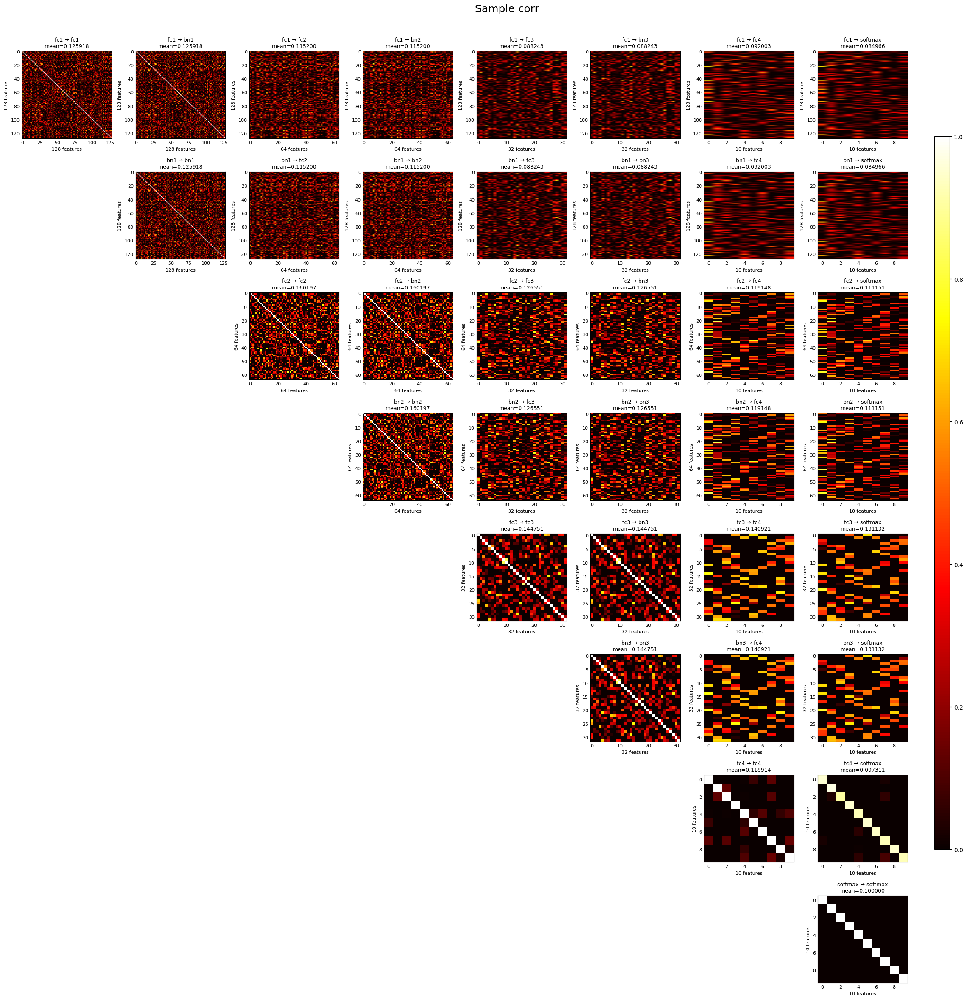

✅ Correlation means updated and saved to sample_corr_means.json


In [ ]:
run_layerwise_correlations_plot_steps(
    MODEL,
    sample_x,
    title="Sample corr",
    json_save_path=f"sample_corr_means.json",
    vis_save_path=f"sample_corr.png",
    pltflg=True
)

In [ ]:
def plot_corr_means_subplots(json_path, figsize=(15, 8)):
    """
    Plot stored correlation means as subplots for each layer.

    Each subplot corresponds to a layer i and shows all correlations
    i -> j (j > i) across epochs.

    Args:
        json_path (str): Path to JSON file containing correlation means.
        figsize (tuple): Size of the matplotlib figure.
    """
    # Load JSON data
    with open(json_path, "r") as f:
        data = json.load(f)

    all_layers = list(data.keys())  # maintain layer order
    n = len(all_layers)

    fig, axes = plt.subplots(n, 1, figsize=figsize, sharex=True)
    if n == 1:
        axes = [axes]  # handle single layer

    for i, layer_x in enumerate(all_layers):
        ax = axes[i]
        # Plot all correlations from layer_x -> layer_y where y > x
        for j, layer_y in enumerate(all_layers):
            if j <= i:
                continue
            if layer_y in data[layer_x]:
                mean_list = data[layer_x][layer_y]
                ax.plot(mean_list, marker='o', label=f"{layer_x} → {layer_y}")

        ax.set_ylabel(f"{layer_x}", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=8, loc='upper right')
        ax.set_xlabel("Epochs", fontsize=12)

    axes[-1].set_xlabel("Epochs", fontsize=12)
    fig.suptitle("Layer-wise Correlation Means Across Epochs", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

/tmp/ipython-input-3975986485.py:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=8, loc='upper right')


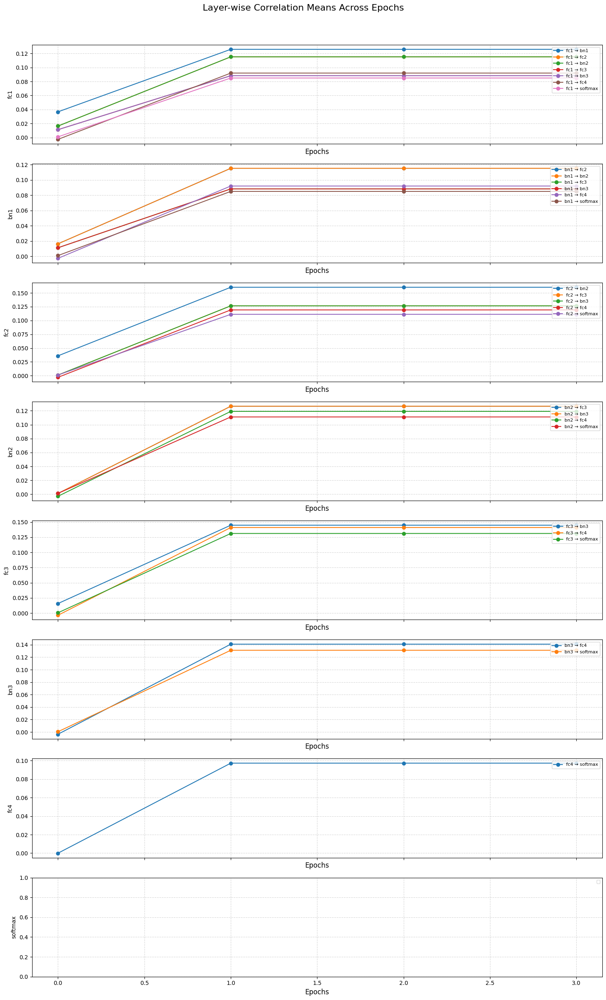

In [ ]:
plot_corr_means_subplots("sample_corr_means.json", figsize=(15, 25))

# Augmentation variancy

In [ ]:
sample_x_small = sample_x[:1]

In [ ]:
from torchvision import transforms

In [ ]:
def augment_batch(x):
    horizontal_flip = transforms.RandomHorizontalFlip(p=0.5)
    vertical_flip = transforms.RandomVerticalFlip(p=0.5)
    rotation = transforms.RandomRotation(degrees=20)
    color_jitter = transforms.ColorJitter(brightness=0.9, contrast=0.9, saturation=0.4, hue=0.4)

    augmentations = transforms.Compose([
      # horizontal_flip,
      # vertical_flip,
      rotation,
      color_jitter
    ])

    aug_x = torch.stack([augmentations(img) for img in x])  # apply per image
    return aug_x

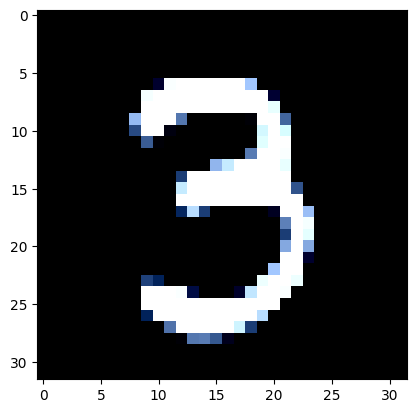

In [ ]:
for i in sample_x_small:
  plt.imshow(torch_to_numpy(i.permute(1,2,0)))
  plt.show()

In [ ]:
def multiple_augmentations(sample_x_small, salting_round = 5):
  aug_x_list = []
  for i in range(salting_round):
    aug_x = augment_batch(sample_x_small)
    aug_x_list.append(aug_x)
  return torch.cat(aug_x_list, dim=0)

In [ ]:
sample_x_small_augs = multiple_augmentations(sample_x_small, salting_round = 300)

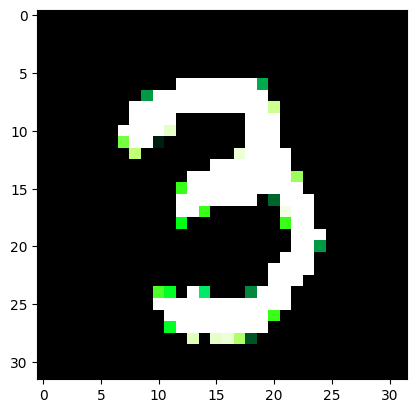

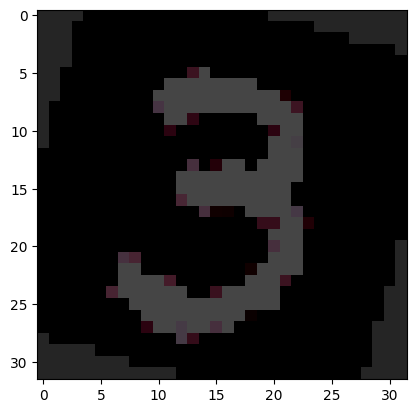

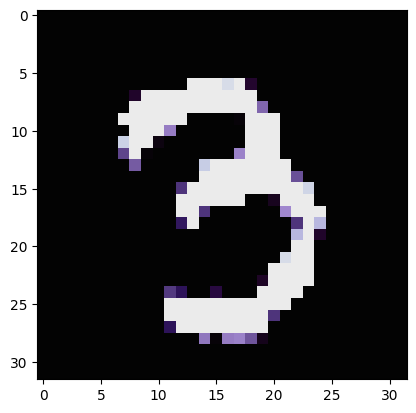

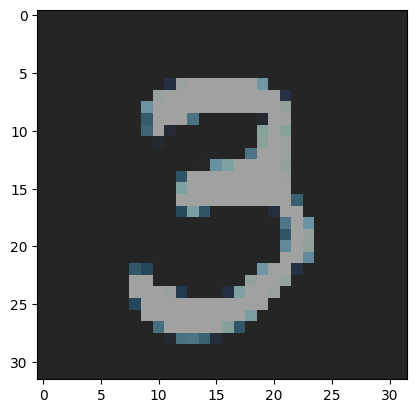

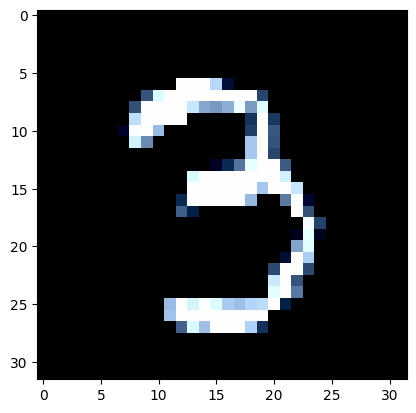

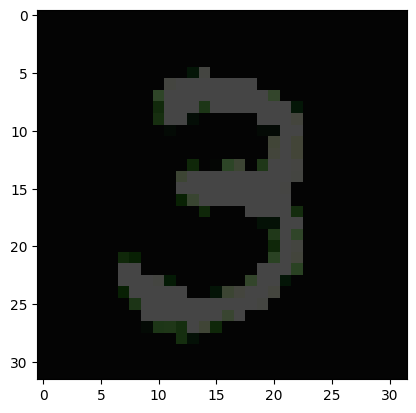

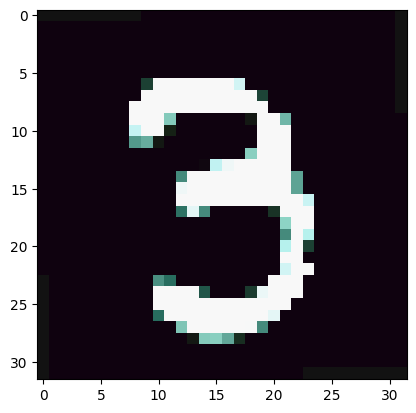

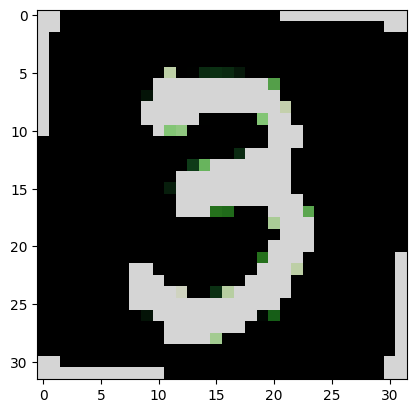

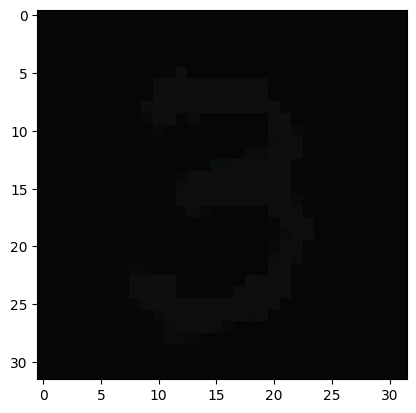

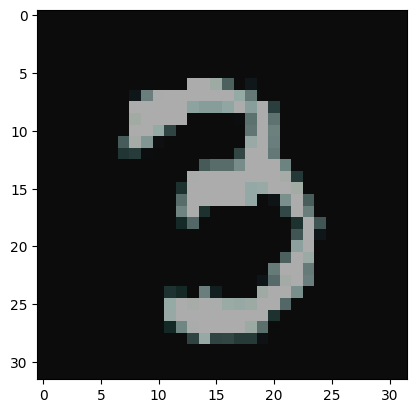

In [ ]:
for i in sample_x_small_augs[:10]:
  plt.imshow(torch_to_numpy(i.permute(1,2,0)))
  plt.show()

In [ ]:
sample_interim_outputs = get_intermediate_outputs(
    MODEL,
    sample_x_small_augs
)

In [ ]:
def compute_correlation_matrix(x, y):
        """
        Compute correlation between two tensors (batch, features_x) and (batch, features_y).
        Returns (features_x, features_y) correlation matrix.
        """
        # center
        x_centered = x - x.mean(dim=0, keepdim=True)
        y_centered = y - y.mean(dim=0, keepdim=True)
        # normalize
        x_std = x_centered.std(dim=0, unbiased=False) + 1e-8
        y_std = y_centered.std(dim=0, unbiased=False) + 1e-8
        x_norm = x_centered / x_std
        y_norm = y_centered / y_std
        # correlation
        return (x_norm.T @ y_norm) / x.size(0)

fc1
torch.Size([300, 128])


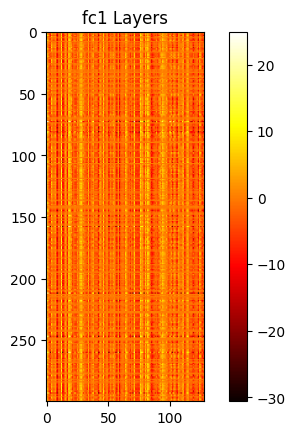

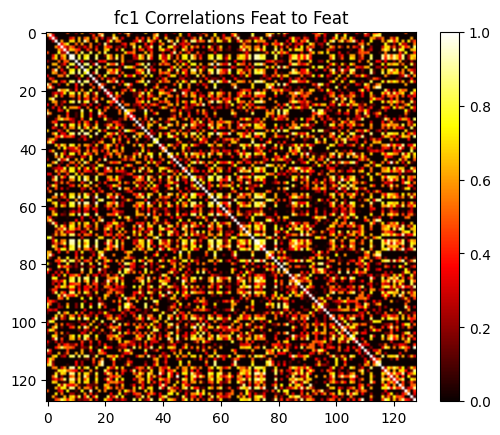

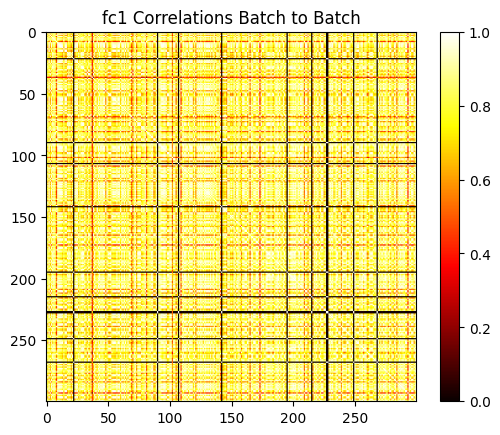

bn1
torch.Size([300, 128])


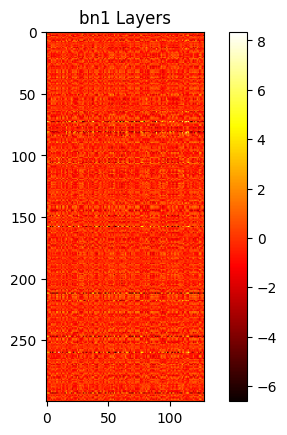

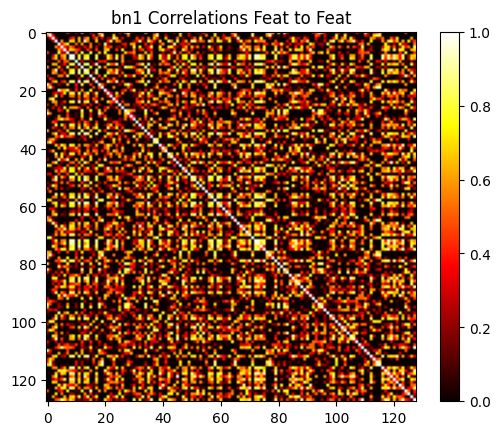

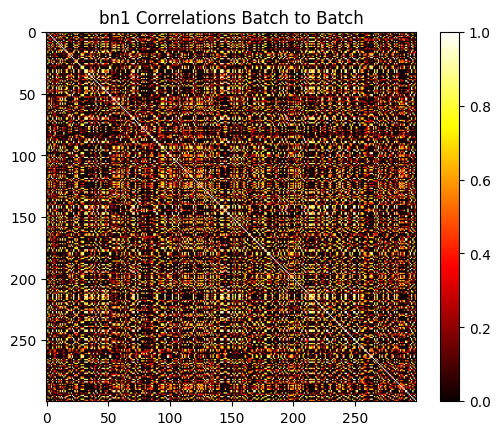

fc2
torch.Size([300, 64])


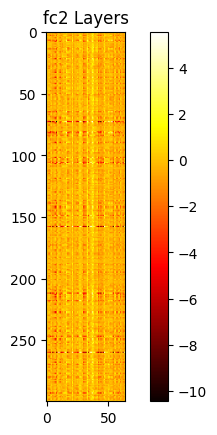

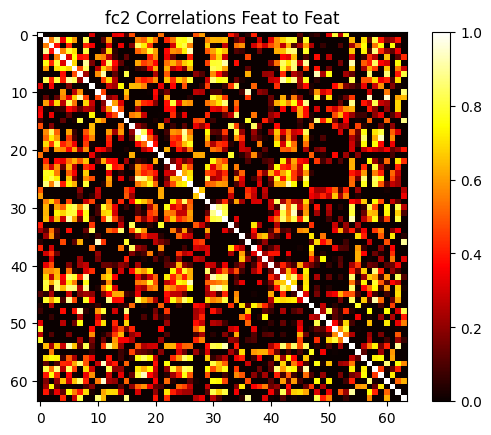

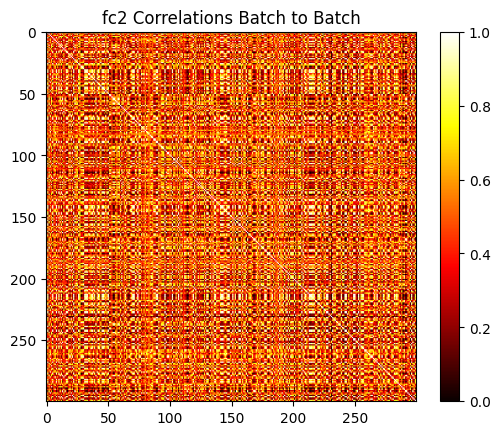

bn2
torch.Size([300, 64])


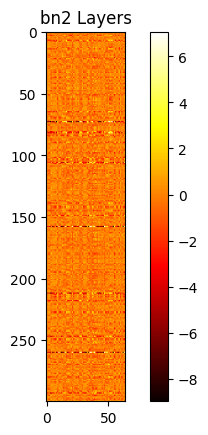

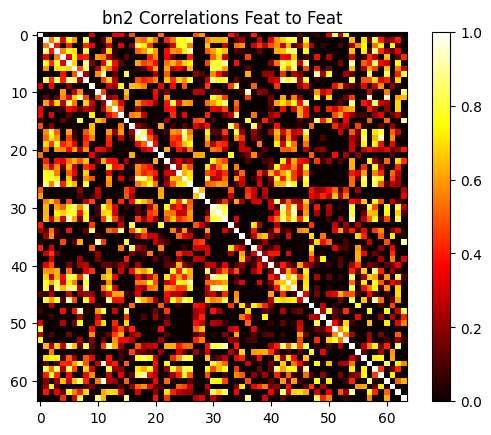

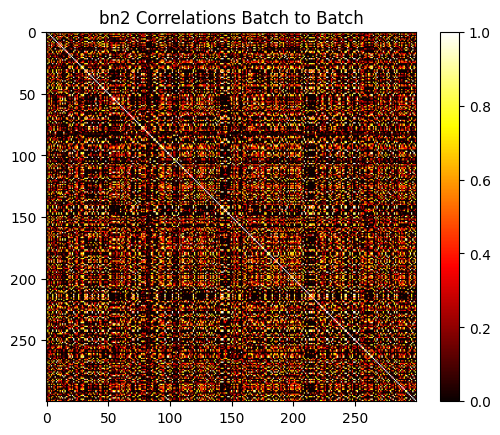

fc3
torch.Size([300, 32])


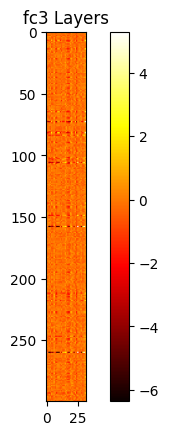

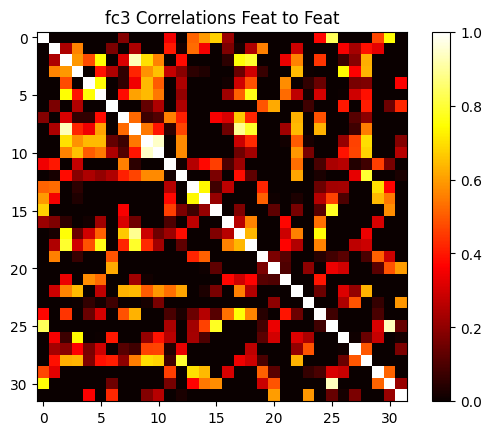

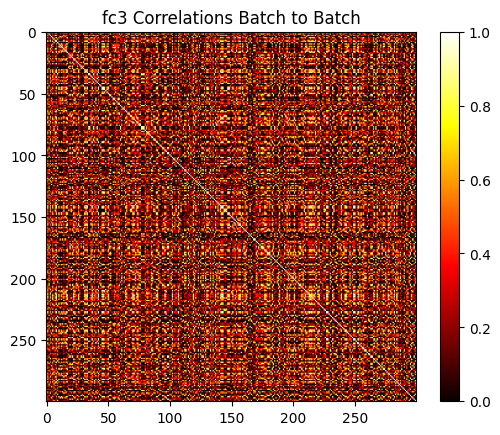

bn3
torch.Size([300, 32])


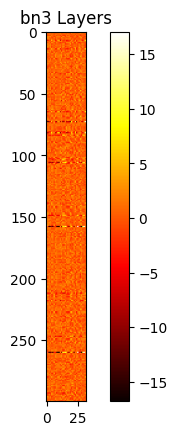

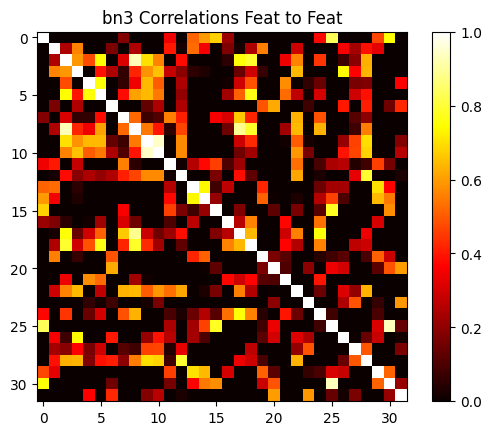

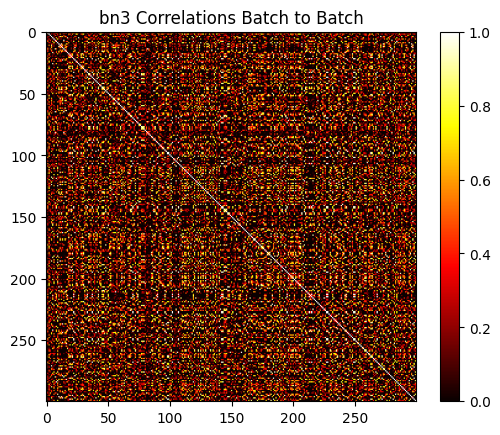

fc4
torch.Size([300, 10])


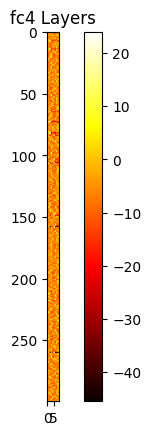

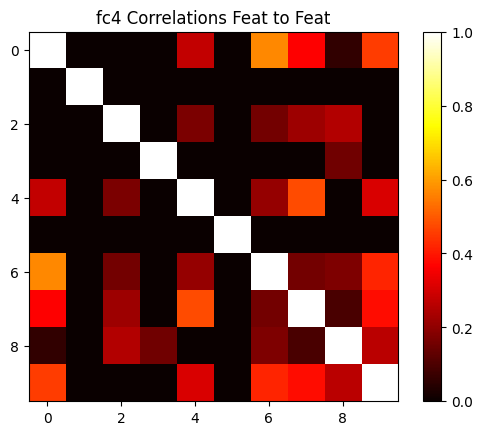

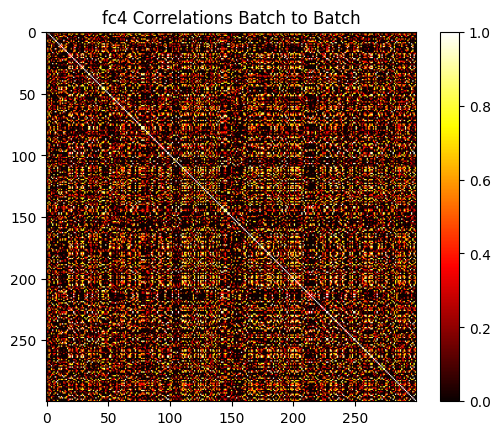

softmax
torch.Size([300, 10])


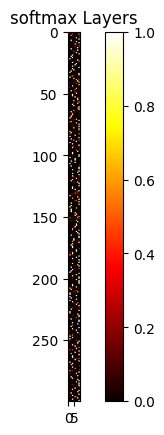

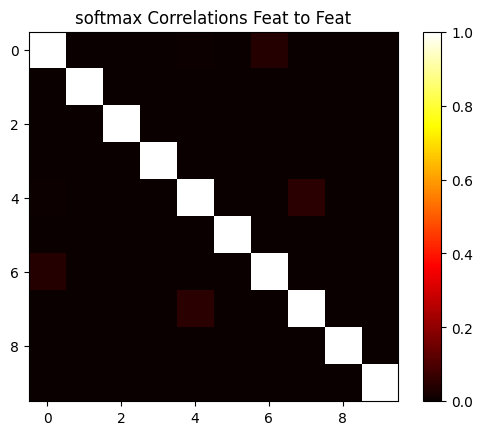

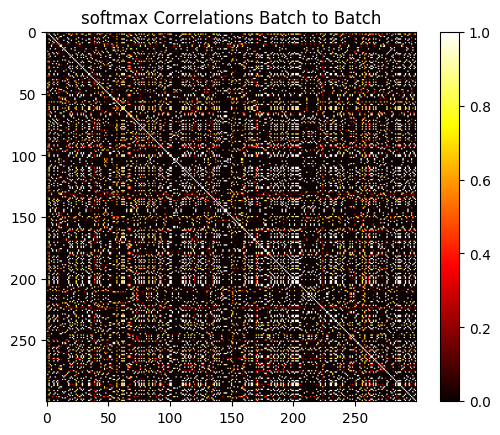

In [ ]:
for layer_name in sample_interim_outputs.keys():
  print(layer_name)
  print(sample_interim_outputs[layer_name].shape)
  interim_output_layer = sample_interim_outputs[layer_name]
  interim_output_layer_flat = interim_output_layer.view(interim_output_layer.size(0), -1)
  corr_ff = compute_correlation_matrix(interim_output_layer_flat, interim_output_layer_flat)
  corr_bb = compute_correlation_matrix(interim_output_layer_flat.T, interim_output_layer_flat.T)
  plt.imshow(torch_to_numpy(interim_output_layer), cmap='hot')
  plt.colorbar()
  plt.title(f"{layer_name} Layers")
  plt.show()
  plt.imshow(torch_to_numpy(corr_ff), cmap='hot', vmin=0, vmax=1)
  plt.colorbar()
  plt.title(f"{layer_name} Correlations Feat to Feat")
  plt.show()
  plt.imshow(torch_to_numpy(corr_bb), cmap='hot', vmin=0, vmax=1)
  plt.colorbar()
  plt.title(f"{layer_name} Correlations Batch to Batch")
  plt.show()

In [ ]:
squared_diff.shape

torch.Size([2, 10])